<a href="https://colab.research.google.com/github/RobertArbon/deep_art_course/blob/master/Deep_Dreaming.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DeepBirb with TensorFlow

__*Robert Arbon*__

This notebook uses Google's DeepDream algorithm to modify  birdsong and images of birds. 

The modification of the images of birds is done via Google's __Deep Dream__ algorithm. The modification of the bird song is done by turning the bird song into an image and then using the __Deep Dream__ algorithm again. 

This notebook is based on the Google Colab seed by  ___Alex Mordvintsev___ called __DeepDream with TensorFlow__.  You can use the original [here](https://research.google.com/seedbank/seed/deepdream).

## Import libraries
To start with we're going to import all the libraries we will need.  Importing libraries at the start is standard practice as it allo

The pretrained Inception network can be downloaded [here](https://storage.googleapis.com/download.tensorflow.org/models/inception5h.zip). This next cell downloads the file automatically and unpacks it locally to the Colab kernel. We can the load the contained model file  'tensorflow_inception_graph.pb' in the cell below.

In [0]:
from io import BytesIO

## Numerical computing modules
import numpy as np # Working with arrays of numbers
import tensorflow as tf # Working with arrays of numbers and the neural nets

## Image modules
import PIL.Image # Python Image Library for working with images
import IPython.display # Allows you to view and listen to files
from IPython.display import clear_output, Image, display

## Audio modules
!pip install librosa # install librosa module
import librosa # Librosa for audio processing
import librosa.display

## Graphing modules
import matplotlib.pyplot as plt # can create charts and other images

## Miscellaneous
from __future__ import print_function # for compatability with Python 2



## Download files

This section downloads files from the web on to the server running this notebook (i.e. somewhere at `colab.research.google.com`).  The '!' at the start of each line indicates that we're switching from using the `Python` programming language to using `bash`.  `bash` is good for file manipulations on Unix/Linux machines (most servers are Linux).



In [0]:
image_url="https://www.livingwithbirds.com/images/web/tweetapedia/21-facts-on-tawny-owl/21-facts-on-tawny-owl-i1.jpg"
audio_url="https://www.xeno-canto.org/sounds/uploaded/OKHOSXCBNN/XC457074-tawny%20xeno%20good%20xy.mp3"
image_classifier_url="https://storage.googleapis.com/download.tensorflow.org/models/inception5h.zip"


!wget -nc -O my_audio.mp3 $audio_url
!wget -O my_image.jpeg $image_url
!wget -nc --no-check-certificate $image_classifier_url


--2019-03-06 16:11:38--  https://www.xeno-canto.org/sounds/uploaded/OKHOSXCBNN/XC457074-tawny%20xeno%20good%20xy.mp3
Resolving www.xeno-canto.org (www.xeno-canto.org)... 145.136.241.178
Connecting to www.xeno-canto.org (www.xeno-canto.org)|145.136.241.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1277401 (1.2M) [audio/mpeg]
Saving to: ‘my_audio.mp3’

my_audio.mp3        100%[===================>]   1.22M   811KB/s    in 1.5s    

2019-03-06 16:11:41 (811 KB/s) - ‘my_audio.mp3’ saved [1277401/1277401]

--2019-03-06 16:11:43--  https://www.livingwithbirds.com/images/web/tweetapedia/21-facts-on-tawny-owl/21-facts-on-tawny-owl-i1.jpg
Resolving www.livingwithbirds.com (www.livingwithbirds.com)... 95.172.14.243
Connecting to www.livingwithbirds.com (www.livingwithbirds.com)|95.172.14.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29109 (28K) [image/jpeg]
Saving to: ‘my_image.jpeg’

my_image.jpeg       100%[===================>]  

## Build the image classifier

First we unzip the downloaded image classifier.  Then we build it.  Don't worry about this code, its very complicated!

In [0]:
!unzip -n inception5h.zip


Archive:  inception5h.zip
  inflating: imagenet_comp_graph_label_strings.txt  
  inflating: tensorflow_inception_graph.pb  
  inflating: LICENSE                 


In [0]:
model_fn = 'tensorflow_inception_graph.pb'

## Creating TensorFlow session and loading the model

# Create a graph and a session
graph = tf.Graph()
sess = tf.InteractiveSession(graph=graph)

# Load the tensorflow inception graph file 
with tf.gfile.FastGFile(model_fn, 'rb') as f:
    graph_def = tf.GraphDef()
    graph_def.ParseFromString(f.read())

# Creates an 'input' layer that correctly adjusts the image for use with 
# the image classifier
t_input = tf.placeholder(np.float32, name='input') 
imagenet_mean = 117.0
t_preprocessed = tf.expand_dims(t_input-imagenet_mean, 0)
tf.import_graph_def(graph_def, {'input':t_preprocessed})

# This is a 'helper' function.  We'll use this later to identify layers
def T(layer):
    '''Helper for getting layer output tensor'''
    return graph.get_tensor_by_name("import/%s:0"%layer)

Instructions for updating:
Use tf.gfile.GFile.


## Deep dream: images

The __Deep Dream__ algorithm is below.  It is....complicated.  However it basically does the following: 





### Our image

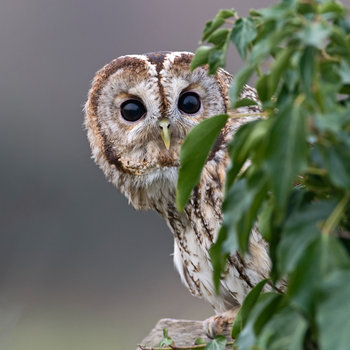

In [0]:
# This opens the image and loads it into the workbook
my_image = PIL.Image.open("my_image.jpeg")
# Just writing the variable name will show it:
my_image

### The algorithm

In [0]:
# These parameters let us control the strenth of the deepdream.
octave_n = 4
octave_scale = 1.4
iter_n = 10
strength = 200

# Helper function that uses TensorFlow to resize an image
def resize(img, new_size):
    return sess.run(tf.image.resize_bilinear(img[np.newaxis,:], new_size))[0]

# Apply gradients to an image in a seires of tiles
def calc_grad_tiled(img, t_grad, tile_size=256):
    '''Random shifts are applied to the image to blur tile boundaries over
    multiple iterations.'''
    h, w = img.shape[:2]
    sx, sy = np.random.randint(tile_size, size=2)
    # We randomly roll the image in x and y to avoid seams between tiles.
    img_shift = np.roll(np.roll(img, sx, 1), sy, 0)
    grad = np.zeros_like(img)
    for y in range(0, max(h-tile_size//2, tile_size),tile_size):
        for x in range(0, max(w-tile_size//2, tile_size),tile_size):
            sub = img_shift[y:y+tile_size,x:x+tile_size]
            g = sess.run(t_grad, {t_input:sub})
            grad[y:y+tile_size,x:x+tile_size] = g
    imggrad = np.roll(np.roll(grad, -sx, 1), -sy, 0)
    # Add the image gradient to the image and return the result
    return img + imggrad*(strength * 0.01 / (np.abs(imggrad).mean()+1e-7))

# Applies deepdream at multiple scales
def render_deepdream(t_obj, input_img, show_steps = True):
    # Collapse the optimization objective to a single number (the loss)
    t_score = tf.reduce_mean(t_obj)
    # We need the gradient of the image with respect to the objective
    t_grad = tf.gradients(t_score, t_input)[0]

    # split the image into a number of octaves (laplacian pyramid)
    img = input_img
    octaves = []
    for i in range(octave_n-1):
        lo = resize(img, np.int32(np.float32(img.shape[:2])/octave_scale))
        octaves.append(img-resize(lo, img.shape[:2]))
        img = lo

    # generate details octave by octave
    for octave in range(octave_n):
        if octave>0:
            hi = octaves[-octave]
            img = resize(img, hi.shape[:2])+hi
        for i in range(iter_n):
            img = calc_grad_tiled(img, t_grad)
        if show_steps:
            clear_output()
            showarray(img)
    return img

In [0]:
def showarray(a, fmt='jpeg'):
    a = np.uint8(np.clip(a, 0, 255))
    f = BytesIO()
    PIL.Image.fromarray(a).save(f, fmt)
    display(Image(data=f.getvalue()))

### Load image and dream!

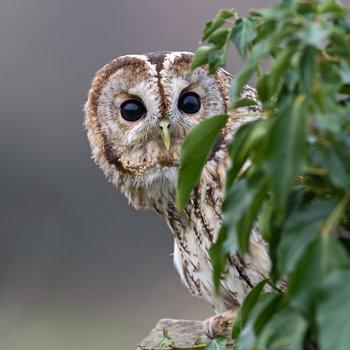

In [0]:
before = sess.run(tf.convert_to_tensor(my_image))
showarray(before)

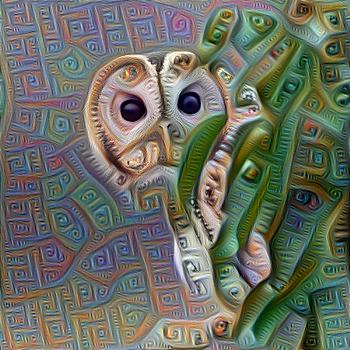

In [0]:
octave_n = 4 #@param {type:"slider", max: 10}
octave_scale = 1.4 #@param {type:"number"}
iter_n = 50 #@param {type:"slider", max: 50}
strength = 98 #@param {type:"slider", max: 1000}
layer = "mixed3a"  #@param ["mixed3a", "mixed3b", "mixed4a", "mixed4c","mixed5a"]

after = render_deepdream(tf.square(T(layer)), before)


## Deep dream: bird song - coming soon! 

This is my code so far - it's not complete because of a rather unexpected problem!  I will complete this soon if people are interested. 

### Our audio

We'll use `librosa` to load the `mp3` file into this notebook. The load function returns two variables, the `waveform` and the `sample rate`. The `waveform` is a list of values representing the audio. The `sample rate` is the number of values per second. 

In [0]:
waveform, sample_rate = librosa.load('my_audio.mp3', sr=None) 

Now let's plot our waveform against time in seconds

Text(0,0.5,'audio signal')

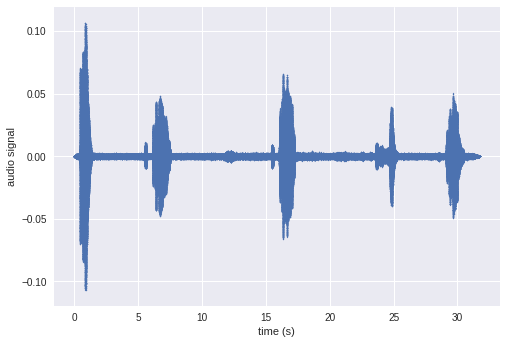

In [0]:
num_samples = len(waveform)
time = np.arange(num_samples)/float(sample_rate)

plt.scatter(time, waveform, s=1)
plt.xlabel('time (s)')
plt.ylabel('audio signal')

We can also listen to it - to check it's what we expect!

In [0]:
IPython.display.Audio(data=waveform, rate=sample_rate)

In [0]:
# Taken from: https://timsainb.github.io/spectrograms-mfccs-and-inversion-in-python.html
# Most of the Spectrograms and Inversion are taken from: https://gist.github.com/kastnerkyle/179d6e9a88202ab0a2fe
from scipy.signal import butter, lfilter
import scipy.ndimage
import copy

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

def overlap(X, window_size, window_step):
    """
    Create an overlapped version of X
    Parameters
    ----------
    X : ndarray, shape=(n_samples,)
        Input signal to window and overlap
    window_size : int
        Size of windows to take
    window_step : int
        Step size between windows
    Returns
    -------
    X_strided : shape=(n_windows, window_size)
        2D array of overlapped X
    """
    if window_size % 2 != 0:
        raise ValueError("Window size must be even!")
    # Make sure there are an even number of windows before stridetricks
    append = np.zeros((window_size - len(X) % window_size))
    X = np.hstack((X, append))

    ws = window_size
    ss = window_step
    a = X

    valid = len(a) - ws
    nw = (valid) // ss
    out = np.ndarray((nw,ws),dtype = a.dtype)

    for i in range(nw):
        # "slide" the window along the samples
        start = i * ss
        stop = start + ws
        out[i] = a[start : stop]

    return out
  
def stft(X, fftsize=128, step=65, mean_normalize=True, real=False, 
          compute_onesided=True):
    """
    Compute STFT for 1D real valued input X
    """
    if real:
        local_fft = np.fft.rfft
        cut = -1
    else:
        local_fft = np.fft.fft
        cut = None
    if compute_onesided:
        cut = fftsize // 2
    if mean_normalize:
        X -= X.mean()

    X = overlap(X, fftsize, step)
    
    size = fftsize
    win = 0.54 - .46 * np.cos(2 * np.pi * np.arange(size) / (size - 1))
    X = X * win[None]
    X = local_fft(X)[:, :cut]
    return X

def pretty_spectrogram(d,log = True, thresh= 5, fft_size = 512, step_size = 64):
    """
    creates a spectrogram
    log: take the log of the spectrgram
    thresh: threshold minimum power for log spectrogram
    """
    specgram = np.abs(stft(d, fftsize=fft_size, step=step_size, real=False,
        compute_onesided=True))
  
    if log == True:
        specgram /= specgram.max() # volume normalize to max 1
        specgram = np.log10(specgram) # take log
        specgram[specgram < -thresh] = -thresh # set anything less than the threshold as the threshold
    else:
        specgram[specgram < thresh] = thresh # set anything less than the threshold as the threshold
    
    return specgram

# Also mostly modified or taken from https://gist.github.com/kastnerkyle/179d6e9a88202ab0a2fe
def invert_pretty_spectrogram(X_s, log = True, fft_size = 512, step_size = 512/4, n_iter = 10):
    
    if log == True:
        X_s = np.power(10, X_s)

    X_s = np.concatenate([X_s, X_s[:, ::-1]], axis=1)
    X_t = iterate_invert_spectrogram(X_s, fft_size, step_size, n_iter=n_iter)
    return X_t

def iterate_invert_spectrogram(X_s, fftsize, step, n_iter=10, verbose=False):
    """
    Under MSR-LA License
    Based on MATLAB implementation from Spectrogram Inversion Toolbox
    References
    ----------
    D. Griffin and J. Lim. Signal estimation from modified
    short-time Fourier transform. IEEE Trans. Acoust. Speech
    Signal Process., 32(2):236-243, 1984.
    Malcolm Slaney, Daniel Naar and Richard F. Lyon. Auditory
    Model Inversion for Sound Separation. Proc. IEEE-ICASSP,
    Adelaide, 1994, II.77-80.
    Xinglei Zhu, G. Beauregard, L. Wyse. Real-Time Signal
    Estimation from Modified Short-Time Fourier Transform
    Magnitude Spectra. IEEE Transactions on Audio Speech and
    Language Processing, 08/2007.
    """
    reg = np.max(X_s) / 1E8
    X_best = copy.deepcopy(X_s)
    for i in range(n_iter):
        if verbose:
            print("Runnning iter %i" % i)
        if i == 0:
            X_t = invert_spectrogram(X_best, step, calculate_offset=True,
                                     set_zero_phase=True)
        else:
            # Calculate offset was False in the MATLAB version
            # but in mine it massively improves the result
            # Possible bug in my impl?
            X_t = invert_spectrogram(X_best, step, calculate_offset=True,
                                     set_zero_phase=False)
        est = stft(X_t, fftsize=fftsize, step=step, compute_onesided=False)
        phase = est / np.maximum(reg, np.abs(est))
        X_best = X_s * phase[:len(X_s)]
    X_t = invert_spectrogram(X_best, step, calculate_offset=True,
                             set_zero_phase=False)
    return np.real(X_t)

def invert_spectrogram(X_s, step, calculate_offset=True, set_zero_phase=True):
    """
    Under MSR-LA License
    Based on MATLAB implementation from Spectrogram Inversion Toolbox
    References
    ----------
    D. Griffin and J. Lim. Signal estimation from modified
    short-time Fourier transform. IEEE Trans. Acoust. Speech
    Signal Process., 32(2):236-243, 1984.
    Malcolm Slaney, Daniel Naar and Richard F. Lyon. Auditory
    Model Inversion for Sound Separation. Proc. IEEE-ICASSP,
    Adelaide, 1994, II.77-80.
    Xinglei Zhu, G. Beauregard, L. Wyse. Real-Time Signal
    Estimation from Modified Short-Time Fourier Transform
    Magnitude Spectra. IEEE Transactions on Audio Speech and
    Language Processing, 08/2007.
    """
    size = int(X_s.shape[1] // 2)
    wave = np.zeros((X_s.shape[0] * step + size))
    # Getting overflow warnings with 32 bit...
    wave = wave.astype('float64')
    total_windowing_sum = np.zeros((X_s.shape[0] * step + size))
    win = 0.54 - .46 * np.cos(2 * np.pi * np.arange(size) / (size - 1))

    est_start = int(size // 2) - 1
    est_end = est_start + size
    for i in range(X_s.shape[0]):
        wave_start = int(step * i)
        wave_end = wave_start + size
        if set_zero_phase:
            spectral_slice = X_s[i].real + 0j
        else:
            # already complex
            spectral_slice = X_s[i]

        # Don't need fftshift due to different impl.
        wave_est = np.real(np.fft.ifft(spectral_slice))[::-1]
        if calculate_offset and i > 0:
            offset_size = size - step
            if offset_size <= 0:
                print("WARNING: Large step size >50\% detected! "
                      "This code works best with high overlap - try "
                      "with 75% or greater")
                offset_size = step
            offset = xcorr_offset(wave[wave_start:wave_start + offset_size],
                                  wave_est[est_start:est_start + offset_size])
        else:
            offset = 0
        wave[wave_start:wave_end] += win * wave_est[
            est_start - offset:est_end - offset]
        total_windowing_sum[wave_start:wave_end] += win
    wave = np.real(wave) / (total_windowing_sum + 1E-6)
    return wave

def xcorr_offset(x1, x2):
    """
    Under MSR-LA License
    Based on MATLAB implementation from Spectrogram Inversion Toolbox
    References
    ----------
    D. Griffin and J. Lim. Signal estimation from modified
    short-time Fourier transform. IEEE Trans. Acoust. Speech
    Signal Process., 32(2):236-243, 1984.
    Malcolm Slaney, Daniel Naar and Richard F. Lyon. Auditory
    Model Inversion for Sound Separation. Proc. IEEE-ICASSP,
    Adelaide, 1994, II.77-80.
    Xinglei Zhu, G. Beauregard, L. Wyse. Real-Time Signal
    Estimation from Modified Short-Time Fourier Transform
    Magnitude Spectra. IEEE Transactions on Audio Speech and
    Language Processing, 08/2007.
    """
    x1 = x1 - x1.mean()
    x2 = x2 - x2.mean()
    frame_size = len(x2)
    half = frame_size // 2
    corrs = np.convolve(x1.astype('float32'), x2[::-1].astype('float32'))
    corrs[:half] = -1E30
    corrs[-half:] = -1E30
    offset = corrs.argmax() - len(x1)
    return offset



In [0]:
### Parameters ###
fft_size = int(512) # window size for the FFT
step_size = int(fft_size/16) # distance to slide along the window (in time)
spec_thresh = 4 # threshold for spectrograms (lower filters out more noise)
lowcut = 500 # Hz # Low cut for our butter bandpass filter
highcut = 10000 # Hz # High cut for our butter bandpass filter
# For mels
n_mel_freq_components = 64 # number of mel frequency channels
shorten_factor = 10 # how much should we compress the x-axis (time)
start_freq = 300 # Hz # What frequency to start sampling our melS from 
end_freq = 8000 # Hz # What frequency to stop sampling our melS from 

In [0]:
data = butter_bandpass_filter(data, lowcut, highcut, sample_rate, order=1)

wav_spec = pretty_spectrogram(data.astype('float64'), fft_size = fft_size, 
                                   step_size = step_size, log = True, thresh = 10)

wav_spec.shape

(3440, 512)

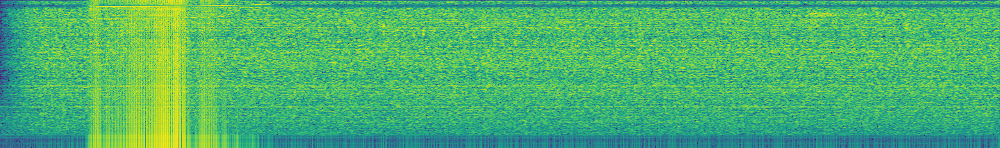

In [0]:
from matplotlib import cm
from sklearn.preprocessing import MinMaxScaler
scaler01 = MinMaxScaler()

wav_spec_scaled = scaler01.fit_transform(wav_spec)
wav_spec_rgb = PIL.Image.fromarray(np.uint8(cm.viridis(np.transpose(wav_spec_scaled))*255))


wav_spec_rgb

In [0]:
#https://stackoverflow.com/questions/45177154/how-to-decode-color-mapping-in-matplotlibs-colormap

def get_value_from_cm(color, cmap, colrange=[0., 1.]):
    import matplotlib
    r = np.linspace(colrange[0], colrange[1], 256) 
    norm = matplotlib.colors.Normalize(colrange[0], colrange[1])
    mapvals = cmap(norm(r))[:, :4] # there are 4 channels: r,g,b,a
    distance = np.sum((mapvals - color) ** 2, axis=1)
    return r[np.argmin(distance)]
  


In [0]:
wav_spec_rgb_scaled = np.array(wav_spec_rgb)/255
wav_spec_rgb_scaled_flat = wav_spec_rgb_scaled.flatten()
wav_spec_gray_flat = np.zeros_like(wav_spec_rgb_scaled_flat)
for i, x in enumerate(wav_spec_rgb_scaled_flat):
  print(i, end=',')
  wav_spec_gray_flat[i] = get_value_from_cm(x, cmap=cm.viridis, 
                                            colrange=[0.0,1.0])
  
  

0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,27

KeyboardInterrupt: ignored

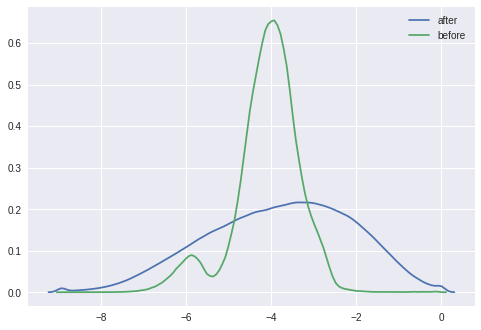

In [0]:
import seaborn as sns
sns.distplot(wav_spec_gray_scaled.flatten(), hist=False, label='after')
sns.distplot(wav_spec.flatten(), hist=False, label='before')
plt.legend()

### Convert birdsong to an image

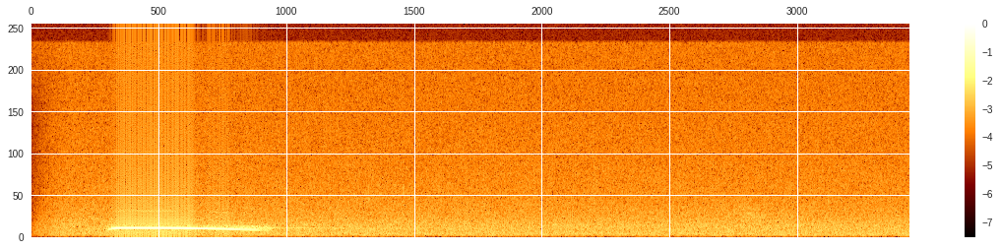

In [0]:
data = waveform[:5*sample_rate]
wav_spectrogram = pretty_spectrogram(data.astype('float64'), fft_size = 512, 
                                   step_size = step_size, log = True, thresh = 10)
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(20,4))
cax = ax.matshow(np.transpose(wav_spectrogram), interpolation='nearest', aspect='auto', cmap=plt.cm.afmhot, origin='lower')
fig.colorbar(cax)

In [0]:
spec_img = PIL.Image.fromarray(wav_spectrogram.astype(np.uint8), mode="L")
# spec_img = spec_img.resize((np.array(spec_img.size)*0.5).astype(int))
spec_img_rgb = PIL.Image.new("RGB", spec_img.size)
spec_img_rgb.paste(spec_img)

(3440, 256, 3)


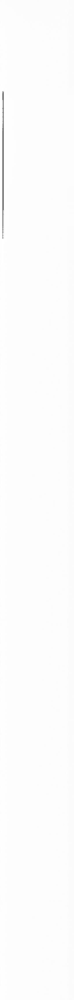

In [0]:
before_spec = sess.run(tf.convert_to_tensor(spec_img_rgb))
print(before_spec.shape)
showarray(before_spec)


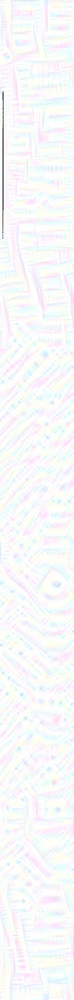

In [0]:
octave_n = 9 #@param {type:"slider", max: 10}
octave_scale = 1.4 #@param {type:"number"}
iter_n = 5 #@param {type:"slider", max: 50}
strength = 115 #@param {type:"slider", max: 1000}
layer = "mixed3a"  #@param ["mixed3a", "mixed3b", "mixed4a", "mixed4c","mixed5a"]


song_image_after = render_deepdream(tf.square(T(layer)), 
                         before_spec)

In [0]:
song_image_after.shape

(856, 256, 3)

In [0]:
# grey_after = sess.run(tf.image.rgb_to_grayscale(
#     song_image_after,
#     name=None
# ))
def rgb2gray(rgb):

    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

    return gray

In [0]:
grey_after = rgb2gray(song_image_after)
grey_after = np.squeeze(grey_after)

print(np.min(wav_spectrogram), np.max(wav_spectrogram))

print(np.min(grey_after), np.max(grey_after))
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(np.min(wav_spectrogram), np.max(wav_spectrogram)))
grey_after_scaled = scaler.fit_transform(grey_after)
print(np.min(grey_after_scaled), np.max(grey_after_scaled))


-7.558707684577349 0.0
-18.99318 289.2871
-7.558708 3.8146973e-06


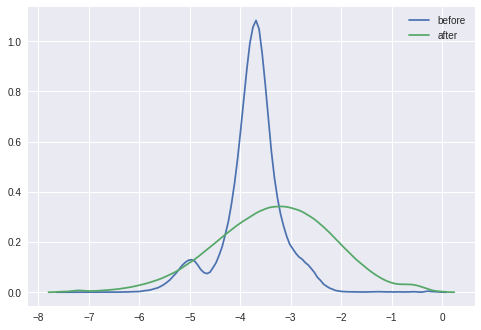

In [0]:
import seaborn as sns
sns.distplot(wav_spectrogram.flatten(), hist=False, label='before')
sns.distplot(grey_after_scaled.flatten(), hist=False, label='after')
plt.legend()

(856, 256)


(856, 256)

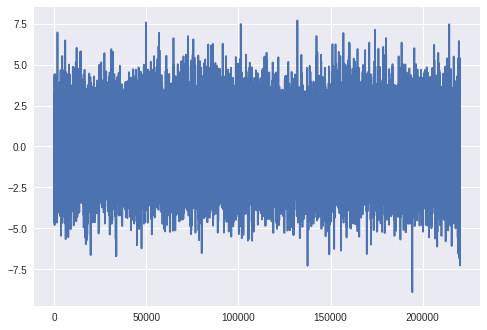

In [0]:
recovered_audio_orig = invert_pretty_spectrogram(grey_after, fft_size = 512,
                                            step_size = step_size, log = False, n_iter = 10)
recovered_filtered = butter_bandpass_filter(recovered_audio_orig, 100, 500, sample_rate, order=1)
plt.plot(recovered_filtered)


In [0]:
IPython.display.Audio(data=recovered_filtered, rate=sample_rate) # play the audio